<a href="https://colab.research.google.com/github/seohyun126/ASCEND/blob/main/EDA_%26_Feature_Engineering_old.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **📌 QnA**
- 무의미한 데이터 시각화 코드 등은 제외하고, 모델링을 하기 위한 feature engineering부분에 관한 가설과 검증 부분만 포함되어 있으면 됨

> EDA 파트에서 Feature Engineering에 직접적으로 관련 있는 부분만 Feature Engineering 파일에 따로 붙여넣기

---

# **1. 데이터 불러오기**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.graph_objects as go
from plotly.subplots import make_subplots

import os
import gc
import pyarrow.parquet as pq
import time

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/2024 BDA 연합공모전_코인채굴꾼/OHLCV.csv')
df

,Time,Open,High,Low,Close,Volume,Maker_ratio
0,2023-01-01 00:00:00,16537.5,16540.9,16504.0,16527.0,5381.399,0.523137
1,2023-01-01 01:00:00,16527.1,16554.3,16524.1,16550.4,3210.826,0.439935
2,2023-01-01 02:00:00,16550.5,16557.1,16534.8,16542.4,2399.668,0.538677
3,2023-01-01 03:00:00,16542.5,16542.5,16515.0,16529.3,3214.480,0.517398
4,2023-01-01 04:00:00,16529.2,16530.4,16508.8,16517.8,3150.954,0.452596
...,...,...,...,...,...,...,...
9403,2024-01-27 19:00:00,41785.0,41977.0,41775.1,41896.4,7765.565,0.473508
9404,2024-01-27 20:00:00,41896.5,42070.0,41896.4,42049.6,5408.243,0.474818
9405,2024-01-27 21:00:00,42049.6,42165.6,42001.8,42137.8,5859.277,0.505293
9406,2024-01-27 22:00:00,42137.8,42187.1,42057.6,42135.3,5271.863,0.527780


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9408 entries, 0 to 9407
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Time         9408 non-null   object 
 1   Open         9408 non-null   float64
 2   High         9408 non-null   float64
 3   Low          9408 non-null   float64
 4   Close        9408 non-null   float64
 5   Volume       9408 non-null   float64
 6   Maker_ratio  9408 non-null   float64
dtypes: float64(6), object(1)
memory usage: 514.6+ KB


In [ ]:
df.describe()

,Open,High,Low,Close,Volume,Maker_ratio
count,9408.000000,9408.000000,9408.000000,9408.000000,9408.000000,9408.000000
mean,29771.803178,29865.354645,29676.537495,29774.602227,16831.177838,0.499994
std,6740.667365,6768.684152,6708.999383,6740.419939,20470.456310,0.045349
min,16504.300000,16524.900000,16488.000000,16504.200000,0.000000,0.000000
25%,26033.350000,26079.650000,25981.575000,26033.925000,5985.100750,0.478145
50%,28007.350000,28110.500000,27909.650000,28009.250000,10366.204500,0.501043
75%,31043.700000,31199.100000,30892.775000,31047.200000,19305.603750,0.524539
max,48577.100000,49027.500000,47209.800000,48577.900000,355275.447000,0.719909


# **2. EDA**

## **2-1. 캔들(Candle) 차트**
- 캔들 차트를 통해 OHLCV 데이터를 시각화 해보자.

In [ ]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.subplots as ms
import plotly.express as px

In [ ]:
# 캔들차트 생성
candle = go.Candlestick(
    x = df['Time'],
    open = df['Open'],
    high = df['High'],
    low = df['Low'],
    close = df['Close'],

    increasing_line_color = 'red', # 상승봉 스타일링
    decreasing_line_color = 'blue', # 하락봉 스타일링
    line = dict(width = 5)
)

fig = go.Figure(data = candle)
fig.update_layout(title_text="OHLCV", title_x=0.5)
fig.show()

## **2-2. 수익률 & 변동성**

In [ ]:
## 수익률, 변동성 계산

def calculate_volatility(data, window=20):
    """
    이동 변동성을 계산하기 위해 수익률의 표준 편차를 사용
    :param data: OHLCV 데이터가 포함된 DataFrame
    :param window: 표준 편차를 계산하는 데 사용할 기간의 수
    :return: 변동성 값을 포함한 DataFrame
    """

    # Calculate daily returns
    data['Returns'] = data['Close'].pct_change()

    # Calculate the rolling standard deviation of returns
    data['Volatility'] = data['Returns'].rolling(window = window).std()

    return data

In [ ]:
df = calculate_volatility(df, window = 20)
df.head(30)

,Time,Open,High,Low,Close,Volume,Maker_ratio,Returns,Volatility
0,2023-01-01 00:00:00,16537.5,16540.9,16504.0,16527.0,5381.399,0.523137,NaN,NaN
1,2023-01-01 01:00:00,16527.1,16554.3,16524.1,16550.4,3210.826,0.439935,0.001416,NaN
2,2023-01-01 02:00:00,16550.5,16557.1,16534.8,16542.4,2399.668,0.538677,-0.000483,NaN
3,2023-01-01 03:00:00,16542.5,16542.5,16515.0,16529.3,3214.480,0.517398,-0.000792,NaN
4,2023-01-01 04:00:00,16529.2,16530.4,16508.8,16517.8,3150.954,0.452596,-0.000696,NaN
5,2023-01-01 05:00:00,16517.8,16531.1,16508.0,16525.7,3268.293,0.389412,0.000478,NaN
6,2023-01-01 06:00:00,16525.6,16545.7,16525.6,16535.3,2726.582,0.446325,0.000581,NaN
7,2023-01-01 07:00:00,16535.3,16537.5,16488.0,16519.6,8852.672,0.482156,-0.000949,NaN
8,2023-01-01 08:00:00,16519.5,16524.9,16502.0,16504.2,3289.761,0.488928,-0.000932,NaN
9,2023-01-01 09:00:00,16504.3,16536.1,16496.8,16532.7,3948.702,0.399090,0.001727,NaN


In [ ]:
# 하나의 figure로 그래프 그리기
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, subplot_titles=("Returns", "Volatility"))

# 수익률 라인 플롯 추가
fig.add_trace(go.Scatter(x=df['Time'], y=df['Returns'], mode='lines', name='Returns', line=dict(color='red')), row=1, col=1)

# 변동성 라인 플롯 추가
fig.add_trace(go.Scatter(x=df['Time'], y=df['Volatility'], mode='lines', name='Volatility', line=dict(color='blue')), row=2, col=1)

# 레이아웃 설정
fig.update_layout(title_text="Returns and Volatility", title_x=0.5)

# 차트 출력
fig.show()

- 수익률의 변화가 급격하게 일어나는 구간에서 변동성의 변화 또한 급격하게 발생함을 확인할 수 있다.

## **2-3. 종가(Close)**

In [ ]:
# 하나의 figure로 그래프 그리기
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, subplot_titles=("Close", "Volatility"))

# 종가 라인 플롯 추가
fig.add_trace(go.Scatter(x=df['Time'], y=df['Close'], mode='lines', name='Close', line=dict(color='red')), row=1, col=1)

# 변동성 라인 플롯 추가
fig.add_trace(go.Scatter(x=df['Time'], y=df['Volatility'], mode='lines', name='Volatility', line=dict(color='blue')), row=2, col=1)

# 레이아웃 설정
fig.update_layout(title_text="Close and Volatility", title_x=0.5)

# 차트 출력
fig.show()

- 캔들차트 변화 양상과 거의 비슷한 형태로 움직이고 있다.
  - 우상향 추세를 보인다.
- 변동성과 눈에 띄는 관계는 확인되지 않는다.

## **2-4. 거래량(Volume)**

In [ ]:
# 하나의 figure로 그래프 그리기
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, subplot_titles=("Volume", "Volatility"))

# 거래량 라인 플롯 추가
fig.add_trace(go.Scatter(x=df['Time'], y=df['Volume'], mode='lines', name='Volume', line=dict(color='red')), row=1, col=1)

# 변동성 라인 플롯 추가
fig.add_trace(go.Scatter(x=df['Time'], y=df['Volatility'], mode='lines', name='Volatility', line=dict(color='blue')), row=2, col=1)

# 레이아웃 설정
fig.update_layout(title_text="Volume and Volatility", title_x=0.5)

# 차트 출력
fig.show()

- 거래량은 별다른 패턴을 보이고 있지 않다.
- 거래량이 많을 때 변동성 또한 커짐을 확인할 수 있다.
  - 거래량이 변동성에 꽤나 큰 영향을 미침을 짐작할 수 있다.

## **2-5. Maker_ratio**
- 특정 시간대에 maker와 taker의 비율에 따라 변동성이 변할까?

In [ ]:
# 하나의 figure로 그래프 그리기
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, subplot_titles=("Maker Ratio", "Volatility"))

# maker 비율 라인 플롯 추가
fig.add_trace(go.Scatter(x=df['Time'], y=df['Maker_ratio'], mode='lines', name='Maker_ratio', line=dict(color='red')), row=1, col=1)

# 변동성 라인 플롯 추가
fig.add_trace(go.Scatter(x=df['Time'], y=df['Volatility'], mode='lines', name='Volatility', line=dict(color='blue')), row=2, col=1)

# 레이아웃 설정
fig.update_layout(title_text="Maker Ratio and Volatility", title_x=0.5)

# 차트 출력
fig.show()

- 큰 상관관계는 보이지 않고 있다.

# **3. Feature Engineering**

## **3-1. 기존 데이터 활용**

### **a) 가격비**
- 종가(Close) / 시가(Open)


In [ ]:
df['price_ratio'] = df['Close'] / (df['Open'] + 1) # 시가가 0일 경우를 대비해 1을 더해줌

In [ ]:
### 시각화

fig = make_subplots(rows=2, cols=1, shared_xaxes=True, subplot_titles=("Price Ratio", "Volatility"))

# 가격비 라인 플롯 추가
fig.add_trace(go.Scatter(x=df['Time'], y=df['price_ratio'], mode='lines', name='Price Ratio', line=dict(color='red')), row=1, col=1)

# 변동성 라인 플롯 추가
fig.add_trace(go.Scatter(x=df['Time'], y=df['Volatility'], mode='lines', name='Volatility', line=dict(color='blue')), row=2, col=1)

# 레이아웃 설정
fig.update_layout(title_text="Price Ratio and Volatility", title_x=0.5)

# 차트 출력
fig.show()

- 가격비가 큰 폭으로 변할 때 변동성 또한 같이 커지는 양상을 보인다.

### **b) 변동폭**
- 고가(High) - 저가(Low)

In [ ]:
df['price_range'] = df['High'] - df['Low']

In [ ]:
### 시각화

fig = make_subplots(rows=2, cols=1, shared_xaxes=True, subplot_titles=("Price Range", "Volatility"))

# 가격비 라인 플롯 추가
fig.add_trace(go.Scatter(x=df['Time'], y=df['price_range'], mode='lines', name='Price Range', line=dict(color='red')), row=1, col=1)

# 변동성 라인 플롯 추가
fig.add_trace(go.Scatter(x=df['Time'], y=df['Volatility'], mode='lines', name='Volatility', line=dict(color='blue')), row=2, col=1)

# 레이아웃 설정
fig.update_layout(title_text="Price Range and Volatility", title_x=0.5)

# 차트 출력
fig.show()

- 가격의 변동 폭이 커질 때 변동성 또한 커지는 경향이 있다.

## **3-2. 기술적 지표**
- 금융 시장을 분석하기 위해 과거의 가격 데이터와 거래량을 연구하여 미래의 가격 움직임을 예측하는 방법
- 기술적 분석은 과거의 가격 패턴과 추세가 반복된다는 믿음에 기반하며, 이러한 패턴을 식별하여 트레이딩에 참여하는 시점을 결정할 수 있다고 생각


### **1️⃣ 변동성(Volatility) 지표**


#### **a) 볼린저 밴드(BB: Bollinger Bands)**
- 주가의 표준 편차를 이용하여 상한선과 하한선을 계산하는 기술적 분석 지표

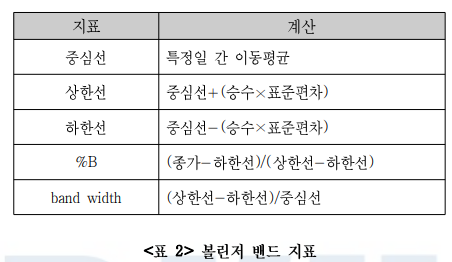


In [ ]:
### 볼린저 밴드 구하기

## 중심 밴드 계산
# 20일 간 이동 평균
df['ma20'] = df['Close'].rolling(window = 20).mean()

## 20일 이동 표준편차
df['stddev'] = df['Close'].rolling(window = 20).std()

## 상단 밴드 계산
# 상한 = 중심선 + 2 * 표준 편차)
df['Upper_bb'] = df['ma20'] + 2 * df['stddev']

## 하한 밴드 계산
# 하한 = 중심선 - 2 * 표준 편차
df['Lower_bb'] = df['ma20'] - 2 * df['stddev']

## %B 계산
# (종가 - 하한선) / (상한선 - 하한선)
df['%B'] = (df['Close'] - df['Lower_bb']) / (df['Upper_bb'] - df['Lower_bb'])

## bandwidth 계산
# (상한 - 하한) / 중심
df['Bollinger_bandwidth'] = (df['Upper_bb'] - df['Lower_bb']) / df['ma20']

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9408 entries, 0 to 9407
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Time                 9408 non-null   object 
 1   Open                 9408 non-null   float64
 2   High                 9408 non-null   float64
 3   Low                  9408 non-null   float64
 4   Close                9408 non-null   float64
 5   Volume               9408 non-null   float64
 6   Maker_ratio          9408 non-null   float64
 7   Returns              9407 non-null   float64
 8   Volatility           9388 non-null   float64
 9   price_ratio          9408 non-null   float64
 10  price_range          9408 non-null   float64
 11  ma20                 9389 non-null   float64
 12  stddev               9389 non-null   float64
 13  Upper_bb             9389 non-null   float64
 14  Lower_bb             9389 non-null   float64
 15  %B                   9389 non-null   f

In [ ]:
### 시각화

## 볼린저밴드 plot
ma20 = go.Scatter(x = df['Time'], y = df['ma20'], line = dict(color = 'black', width=0.9), name='ma20')
upper = go.Scatter(x = df['Time'], y = df['Upper_bb'], line=dict(color='red', width=2), name='bol_upper')
lower = go.Scatter(x = df['Time'], y = df['Lower_bb'], line=dict(color='green', width=2), name='bol_lower')

## bandwidth plot
bandwidth = go.Scatter(x = df['Time'], y = df['Bollinger_bandwidth'], line=dict(color='orange', width=2), name='bandwidth')

## 변동성 plot
volatility = go.Scatter(x = df['Time'], y = df['Volatility'], line = dict(color = 'blue'), name='volatility')

## 그래프 객체 넣기
fig = make_subplots(rows = 3, cols = 1, shared_xaxes=True, subplot_titles=("Bollinger Bands", "Bandwidth", "Volatility"))

# 볼린저 밴드를 첫 번째 행에 추가
fig.add_trace(ma20, row = 1, col = 1)
fig.add_trace(upper, row = 1, col = 1)
fig.add_trace(lower, row = 1, col = 1)

# 밴드 대역폭을 두 번째 행에 추가
fig.add_trace(bandwidth, row = 2, col = 1)

# 변동성을 세 번째 행에 추가
fig.add_trace(volatility, row = 3, col = 1)

## 레이아웃 설정
fig.update_layout(height = 800, title_text="Bollinger Bands & Volatility", title_x=0.5)
fig.show()

- band width 변화 양상과 volatility 변화 양상이 거의 비슷하게 나타남을 확인할 수 있다.

#### **b) 애버리지 트루 레인지(ATR: Average True Range)**
- 시장 변동성을 측정하고, 트레이더가 적절한 손절 레벨과 포지션 크기를 결정하는 데 널리 사용되는 기술 분석 지표


- 공식  
  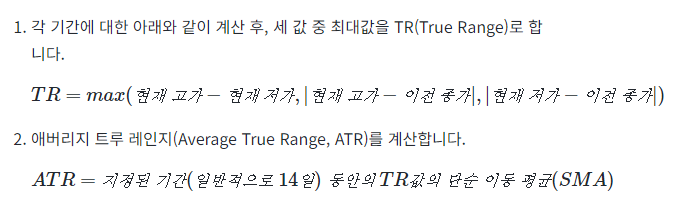


In [ ]:
### ATR 구하기

## 1. True Range 계산
# df['price_range'] = df['High'] - df['Low']
df['High-PrevClose'] = abs( df['High'] - df['Close'].shift(1) )
df['Low-PrevClose'] = abs( df['Low'] - df['Close'].shift(1) )
df['TR'] = df[['price_range', 'High-PrevClose', 'Low-PrevClose']].max(axis = 1)

## 2. ATR 계산
# 20일 동안의 TR 값의 단순 이동 평균
df['ATR'] = df['TR'].rolling(window = 20).mean()

# 불필요한 열 제거
df = df.drop(['High-PrevClose', 'Low-PrevClose', 'TR'], axis = 1)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9408 entries, 0 to 9407
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Time                 9408 non-null   object 
 1   Open                 9408 non-null   float64
 2   High                 9408 non-null   float64
 3   Low                  9408 non-null   float64
 4   Close                9408 non-null   float64
 5   Volume               9408 non-null   float64
 6   Maker_ratio          9408 non-null   float64
 7   Returns              9407 non-null   float64
 8   Volatility           9388 non-null   float64
 9   price_ratio          9408 non-null   float64
 10  price_range          9408 non-null   float64
 11  ma20                 9389 non-null   float64
 12  stddev               9389 non-null   float64
 13  Upper_bb             9389 non-null   float64
 14  Lower_bb             9389 non-null   float64
 15  %B                   9389 non-null   f

In [ ]:
### 시각화

fig = make_subplots(rows = 2, cols = 1, shared_xaxes=True, subplot_titles=("ATR", "Volatility"))

# ATR 라인 플롯 추가
fig.add_trace(go.Scatter(x=df['Time'], y=df['ATR'], mode='lines', name='ATR', line=dict(color='red')), row=1, col=1)

# 변동성 라인 플롯 추가
fig.add_trace(go.Scatter(x=df['Time'], y=df['Volatility'], mode='lines', name='Volatility', line=dict(color='blue')), row=2, col=1)

# 레이아웃 설정
fig.update_layout(title_text="ATR and Volatility", title_x=0.5)

# 차트 출력
fig.show()

- ATR의 변화 양상과 volatility의 변화 양상이 거의 비슷하게 나타남을 확인할 수 있다.

#### **c) Moving Window Standard Deviation**
- 데이터의 이동 창(rolling window)을 이용하여 일정 기간 동안의 표준 편차를 계산
  - 여기서는 20일을 활용
- 주어진 기간 동안의 가격 변동성을 계산
  - 현재 시장의 불안정성을 파악할 수 있음


In [ ]:
## 위에서 이미 계산함

# df['stddev'] = df['Close'].rolling(window = 20).std()

#### **d) Envelope**
- 한 개의 이동평균선을 계산 후 이를 위아래로 n% 이동시킴


In [ ]:
### Envelope 구하기

## 이동평균선 계산
# 20일 간 이동 평균
# df['ma20'] = df['Close'].rolling(window = 20).mean()

## 위아래로 n% 이동
# 현재는 1% 이동
envelope_percentage = 1
df['Upper_Envelope'] = df['ma20'] * (1 + envelope_percentage / 100)
df['Lower_Envelope'] = df['ma20'] * (1 - envelope_percentage / 100)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9408 entries, 0 to 9407
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Time                 9408 non-null   object 
 1   Open                 9408 non-null   float64
 2   High                 9408 non-null   float64
 3   Low                  9408 non-null   float64
 4   Close                9408 non-null   float64
 5   Volume               9408 non-null   float64
 6   Maker_ratio          9408 non-null   float64
 7   Returns              9407 non-null   float64
 8   Volatility           9388 non-null   float64
 9   price_ratio          9408 non-null   float64
 10  price_range          9408 non-null   float64
 11  ma20                 9389 non-null   float64
 12  stddev               9389 non-null   float64
 13  Upper_bb             9389 non-null   float64
 14  Lower_bb             9389 non-null   float64
 15  %B                   9389 non-null   f

In [ ]:
## Envelope plot
ma20 = go.Scatter(x = df['Time'], y = df['ma20'], line = dict(color = 'black', width=0.9), name='ma20')
upper = go.Scatter(x = df['Time'], y = df['Upper_Envelope'], line=dict(color='red', width=2), name='upper_envelope')
lower = go.Scatter(x = df['Time'], y = df['Lower_Envelope'], line=dict(color='green', width=2), name='lower_envelope')

## 변동성 plot
volatility = go.Scatter(x = df['Time'], y = df['Volatility'], line = dict(color = 'blue'), name='volatility')

## 그래프 객체 넣기
fig = make_subplots(rows = 2, cols = 1, shared_xaxes=True, subplot_titles=("Envelope", "Volatility"))

# Envelope를 첫 번째 행에 추가
fig.add_trace(ma20, row = 1, col = 1)
fig.add_trace(upper, row = 1, col = 1)
fig.add_trace(lower, row = 1, col = 1)

# 변동성을 두 번째 행에 추가
fig.add_trace(volatility, row = 2, col = 1)

## 레이아웃 설정
fig.update_layout(height = 600, title_text="Envelope & Volatility", title_x=0.5)
fig.show()

#### **e) 켈트너 채널(Keltner Channel)**
- 채널과 관련된 가격 행동을 분석하여 추세의 강도와 방향을 평가하는 지표

In [ ]:
### 켈트너 채널 구하기

## 중간선 계산
# 20일을 기준으로 함
df['EMA_20'] = df['Close'].ewm(span = 20, adjust = False).mean() # adjust=False를 통해 가중치를 지수적으로 조정하지 않음

## 상한선 계산
df['Upper_KC'] = df['EMA_20'] + 2 * df['ATR']

## 하한선 계산
df['Lower_KC'] = df['EMA_20'] - 2 * df['ATR']

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9408 entries, 0 to 9407
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Time                 9408 non-null   object 
 1   Open                 9408 non-null   float64
 2   High                 9408 non-null   float64
 3   Low                  9408 non-null   float64
 4   Close                9408 non-null   float64
 5   Volume               9408 non-null   float64
 6   Maker_ratio          9408 non-null   float64
 7   Returns              9407 non-null   float64
 8   Volatility           9388 non-null   float64
 9   price_ratio          9408 non-null   float64
 10  price_range          9408 non-null   float64
 11  ma20                 9389 non-null   float64
 12  stddev               9389 non-null   float64
 13  Upper_bb             9389 non-null   float64
 14  Lower_bb             9389 non-null   float64
 15  %B                   9389 non-null   f

In [ ]:
### 시각화

## KC plot
ema20 = go.Scatter(x = df['Time'], y = df['ma20'], line = dict(color = 'black', width=0.9), name='ema20')
upper = go.Scatter(x = df['Time'], y = df['Upper_KC'], line=dict(color='red', width=2), name='upper_KC')
lower = go.Scatter(x = df['Time'], y = df['Lower_KC'], line=dict(color='green', width=2), name='lower_KC')

## 변동성 plot
volatility = go.Scatter(x = df['Time'], y = df['Volatility'], line = dict(color = 'blue'), name='volatility')

## 그래프 객체 넣기
fig = make_subplots(rows = 2, cols = 1, shared_xaxes=True, subplot_titles=("Keltner Channel", "Volatility"))

# Envelope를 첫 번째 행에 추가
fig.add_trace(ema20, row = 1, col = 1)
fig.add_trace(upper, row = 1, col = 1)
fig.add_trace(lower, row = 1, col = 1)

# 변동성을 두 번째 행에 추가
fig.add_trace(volatility, row = 2, col = 1)

## 레이아웃 설정
fig.update_layout(height = 600, title_text = "Keltner Channel & Volatility", title_x=0.5)
fig.show()

#### **f) 돈치안 채널(Donchian Channel)**
- 추세 반전, 돌파, 잠재적 트레이딩 기회를 파악하는 데 도움이 되는 기술 분석 도구
- 가격 행동을 채널과 관련하여 분석하여 돌파 및 반전을 파악하는 데 도움이 되는 지표

In [ ]:
### 돈치안 채널

## 과거 기간 설정
N = 20

## 밴드 계산
df['Upper_DC'] = df['High'].rolling(window = N).max() # 상단 밴드 계산
df['Lower_DC'] = df['Low'].rolling(window = N).min()  # 하단 밴드 계산
df['Middle_DC'] = (df['Upper_DC'] + df['Lower_DC']) / 2  # 중간 선 계산

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9408 entries, 0 to 9407
Data columns (total 26 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Time                 9408 non-null   object 
 1   Open                 9408 non-null   float64
 2   High                 9408 non-null   float64
 3   Low                  9408 non-null   float64
 4   Close                9408 non-null   float64
 5   Volume               9408 non-null   float64
 6   Maker_ratio          9408 non-null   float64
 7   Returns              9407 non-null   float64
 8   Volatility           9388 non-null   float64
 9   price_ratio          9408 non-null   float64
 10  price_range          9408 non-null   float64
 11  ma20                 9389 non-null   float64
 12  stddev               9389 non-null   float64
 13  Upper_bb             9389 non-null   float64
 14  Lower_bb             9389 non-null   float64
 15  %B                   9389 non-null   f

In [ ]:
### 시각화

## DC plot
upper = go.Scatter(x = df['Time'], y = df['Upper_DC'], line=dict(color='red', width=2), name='upper_DC')
lower = go.Scatter(x = df['Time'], y = df['Lower_DC'], line=dict(color='green', width=2), name='lower_DC')
middle = go.Scatter(x = df['Time'], y = df['Middle_DC'], line = dict(color = 'black', width=0.9), name='middle_DC')

## 변동성 plot
volatility = go.Scatter(x = df['Time'], y = df['Volatility'], line = dict(color = 'blue'), name='volatility')

## 그래프 객체 넣기
fig = make_subplots(rows = 2, cols = 1, shared_xaxes=True, subplot_titles=("Donchian Channel", "Volatility"))

# Envelope를 첫 번째 행에 추가
fig.add_trace(upper, row = 1, col = 1)
fig.add_trace(lower, row = 1, col = 1)
fig.add_trace(middle, row = 1, col = 1)

# 변동성을 두 번째 행에 추가
fig.add_trace(volatility, row = 2, col = 1)

## 레이아웃 설정
fig.update_layout(height = 600, title_text = "Donchian Channel & Volatility", title_x=0.5)
fig.show()

#### **g) 상대변동지표(RVI, Relative Volatility Index)**
- RSI(Relative Strength Index)의 변형된 형태로, 주가의 변동성을 측정하기 위해 개발된 지표
- 변동성의 일반적인 방향을 측정하거나 보고하기 위한 지표

  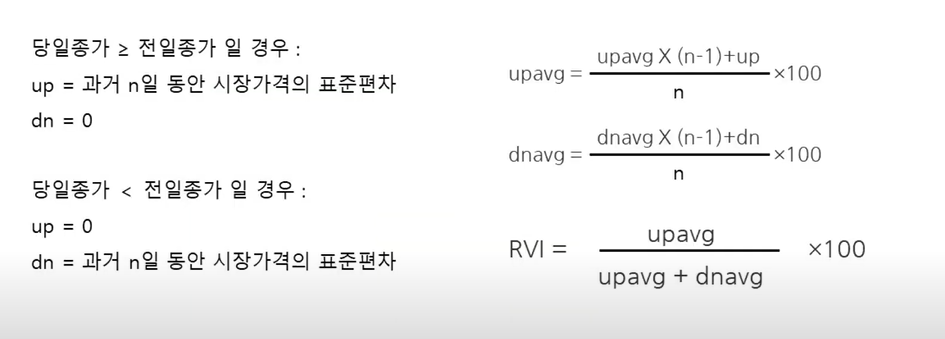

In [ ]:
### RVI 구하기

## 20일 동안의 종가의 표준편차 계산
df['STD_20'] = df['Close'].rolling(window = 20).std()

## 상승 및 하락 가격 계산
df['U'] = np.where(df['Close'] > df['Close'].shift(1), df['STD_20'], 0)
df['D'] = np.where(df['Close'] < df['Close'].shift(1), df['STD_20'], 0)

## AU 및 AD 계산
df[['AU', 'AD']] = df[['U', 'D']].ewm(span = 20, adjust = False).mean()

## RVI 계산
df['RVI'] = 100 * df['AU'] / (df['AU'] + df['AD'])

## 필요없는 변수 삭제
df.drop(['STD_20', 'U', 'D', 'AU', 'AD'], axis=1, inplace=True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9408 entries, 0 to 9407
Data columns (total 27 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Time                 9408 non-null   object 
 1   Open                 9408 non-null   float64
 2   High                 9408 non-null   float64
 3   Low                  9408 non-null   float64
 4   Close                9408 non-null   float64
 5   Volume               9408 non-null   float64
 6   Maker_ratio          9408 non-null   float64
 7   Returns              9407 non-null   float64
 8   Volatility           9388 non-null   float64
 9   price_ratio          9408 non-null   float64
 10  price_range          9408 non-null   float64
 11  ma20                 9389 non-null   float64
 12  stddev               9389 non-null   float64
 13  Upper_bb             9389 non-null   float64
 14  Lower_bb             9389 non-null   float64
 15  %B                   9389 non-null   f

In [ ]:
### 시각화

# RVI 추가
RVI = go.Scatter(x = df['Time'], y = df['RVI'], line = dict(color = 'red', width = 2), name = 'RVI', legendgroup = 'group5', legendgrouptitle_text = 'RVI')

# 과매수매도구간 데이터 추가 (선으로 표현하기 위하여)
df['과매수구간'] = 60
df['과매도구간'] = 40

# 그래프 객체 넣기
fig = make_subplots(specs = [[{"secondary_y": True}]])

# creating first plot
fig.add_trace(
    go.Scatter(x = df['Time'], y = df['RVI'], name = 'RVI'),
    secondary_y = False,
)

# creating next plot
fig.add_trace(
    go.Scatter(x = df['Time'], y = df['과매수구간'], name = '과매수구간') ,

    secondary_y = True,
)

# creating next plot
fig.add_trace(
    go.Scatter(x = df['Time'], y = df['과매도구간'], name = '과매도구간') ,

    secondary_y = True,
)
fig.update_layout(title_text = "RVI", title_x = 0.5)
fig.show()

In [ ]:
## 필요없는 변수 삭제
df.drop(['과매수구간', '과매도구간'], axis=1, inplace=True)

### **2️⃣ 추세(Trend) 지표**
- 전반적인 시장 추세의 방향과 강도를 파악하는 데 도움
- 가격의 흐름을 부드럽게 만들어 기술적으로 추세를 따라가고 시장 움직임을 파악하는 데 도움

#### **a) 이동 평균선**
- 단순이동평균과 지수이동평균은 이미 계산되어 있으니 가중이동평균을 계산해보자.


In [ ]:
## 가중이동평균(WMA) 계산

weights = np.arange(1,21) # 가중치 생성
df['WMA_20'] = df['Close'].rolling(window = 20).apply(lambda x: np.dot(x, weights) / weights.sum(), raw=True)

In [ ]:
### 시각화

# 그래프 그리기
fig = px.line(df, x='Time', y=['Open', 'High', 'Low', 'Close', 'WMA_20'],
              labels={'value': 'Price', 'variable': 'Price Type'},
              title='Price Time Series with WMA_20',
              line_shape='linear',
              color_discrete_map={'Open': 'blue', 'High': 'green', 'Low': 'red', 'Close': 'purple', 'WMA_20': 'orange'})

# 그래프에 축 레이블 추가
fig.update_xaxes(title_text='Time')
fig.update_yaxes(title_text='Price')

# 그래프 표시
fig.show()

#### **b) 이동평균 수렴 확산 지수(Moving Average Convergence/Divergence, MACD)**
- 서로 다른 이동평균선 사이의 관계에서 추세변화의 신호를 찾아 추세 방향과 주가 움직임을 분석하는 지표

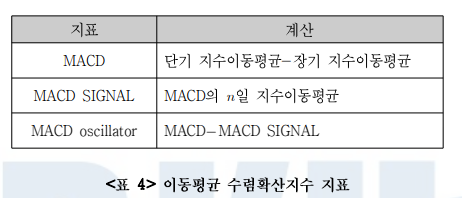

In [ ]:
## 단기 지수이동평균(EMA) 계산
# 12일 기간
fast_ema = df['Close'].ewm(span = 12, adjust = False).mean()

## 장기 EMA 계산
# 26일 기간
slow_ema = df['Close'].ewm(span = 26, adjust = False).mean()

## MACD 계산
df['MACD'] = fast_ema - slow_ema

## MACD 시그널 계산
# 9일 기간
df['MACD_signal'] = df['MACD'].ewm(span = 9, adjust = False).mean()

## MACD 오실레이터 계산
df['MACD_oscillator'] = df['MACD'] - df['MACD_signal']

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9408 entries, 0 to 9407
Data columns (total 31 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Time                 9408 non-null   object 
 1   Open                 9408 non-null   float64
 2   High                 9408 non-null   float64
 3   Low                  9408 non-null   float64
 4   Close                9408 non-null   float64
 5   Volume               9408 non-null   float64
 6   Maker_ratio          9408 non-null   float64
 7   Returns              9407 non-null   float64
 8   Volatility           9388 non-null   float64
 9   price_ratio          9408 non-null   float64
 10  price_range          9408 non-null   float64
 11  ma20                 9389 non-null   float64
 12  stddev               9389 non-null   float64
 13  Upper_bb             9389 non-null   float64
 14  Lower_bb             9389 non-null   float64
 15  %B                   9389 non-null   f

In [ ]:
### 시각화

# MACD 생성하기
MACD = go.Scatter(x = df['Time'], y = df['MACD'], line = dict(color = 'red', width = 2), name='MACD', legendgroup='group2', legendgrouptitle_text='MACD')
MACD_signal = go.Scatter(x = df['Time'], y = df['MACD_signal'], line = dict(color = 'green', width = 2), name='MACD_signal')
MACD_oscillator = go.Bar(x = df['Time'], y = df['MACD_oscillator'], marker_color = 'purple', name='MACD_oscillator')

# 그래프 객체 넣기
fig = ms.make_subplots(rows=2, cols=1,  shared_xaxes=True,shared_yaxes=False, horizontal_spacing=0.05, vertical_spacing=0.02)

fig.add_trace(MACD,row=1,col=1)
fig.add_trace(MACD_signal,row=1,col=1)
fig.add_trace(MACD_oscillator,row=1,col=1)

fig.add_trace(go.Scatter(x=df['Time'], y=df['Volatility'], mode='lines', name='Volatility', line=dict(color='blue')), row=2, col=1)

fig.update_layout(title_text="MACD", title_x=0.5)
fig.show()

### **3️⃣ 모멘텀(Momentum) 지표**

#### **a) 스토캐스틱 오실레이터(Stochastic Oscillator)**
- 당일 종가의 위치를 관찰하기 위해 백분율로 나타낸 추세 관련 지표
- %K와 %D 라인 두 개로 구성  
  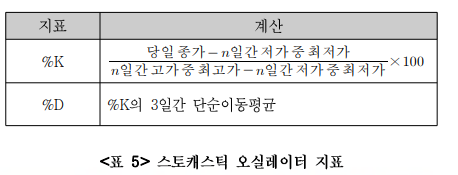

In [ ]:
## n = 20
# 최고가(High)와 최저가(Low) 계산
df['20days_High'] = df['High'].rolling(window = 20).max()
df['20days_Low'] = df['Low'].rolling(window = 20).min()

## %K 계산
df['%K'] = ((df['Close'] - df['20days_Low']) / (df['20days_High'] - df['20days_Low'])) * 100

## %D 계산
# %K의 3일 동안의 이동평균
df['%D'] = df['%K'].rolling(window = 3).mean()

## 필요없는 열 제거
# 20days_High, 20days_Low 열 제거
df.drop(['20days_High','20days_Low'],axis = 1,inplace = True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9408 entries, 0 to 9407
Data columns (total 33 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Time                 9408 non-null   object 
 1   Open                 9408 non-null   float64
 2   High                 9408 non-null   float64
 3   Low                  9408 non-null   float64
 4   Close                9408 non-null   float64
 5   Volume               9408 non-null   float64
 6   Maker_ratio          9408 non-null   float64
 7   Returns              9407 non-null   float64
 8   Volatility           9388 non-null   float64
 9   price_ratio          9408 non-null   float64
 10  price_range          9408 non-null   float64
 11  ma20                 9389 non-null   float64
 12  stddev               9389 non-null   float64
 13  Upper_bb             9389 non-null   float64
 14  Lower_bb             9389 non-null   float64
 15  %B                   9389 non-null   f

In [ ]:
### 시각화

# 스토캐스틱 지표 생성하기
k_line = go.Scatter(x = df['Time'], y = df['%K'], line = dict(color = 'green', width = 2), name='k_line')
d_line = go.Scatter(x = df['Time'], y = df['%D'], line = dict(color = 'red', width = 2), name = 'd_line')

# 그래프 객체 넣기
fig = go.Figure(data = [k_line, d_line])

# 레이아웃 설정
fig.update_layout(title_text = "Stochastic Oscillator", title_x = 0.5)

# 차트 출력
fig.show()

### **4️⃣ 거래량(Volume) 지표**

#### **a) 누적 거래량 델타(CVD, Cumulative Volume Delta)**
- 시장에서의 거래 활동을 측정하는 지표 중 하나
  - 매수(Buy) 양과 매도(Sell) 양의 차이를 누적해서 보여주는 지표



In [ ]:
### CVD 계산

df['CVD'] = (df['Volume'] * (1 - 2 * df['Maker_ratio'])).cumsum()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9408 entries, 0 to 9407
Data columns (total 34 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Time                 9408 non-null   object 
 1   Open                 9408 non-null   float64
 2   High                 9408 non-null   float64
 3   Low                  9408 non-null   float64
 4   Close                9408 non-null   float64
 5   Volume               9408 non-null   float64
 6   Maker_ratio          9408 non-null   float64
 7   Returns              9407 non-null   float64
 8   Volatility           9388 non-null   float64
 9   price_ratio          9408 non-null   float64
 10  price_range          9408 non-null   float64
 11  ma20                 9389 non-null   float64
 12  stddev               9389 non-null   float64
 13  Upper_bb             9389 non-null   float64
 14  Lower_bb             9389 non-null   float64
 15  %B                   9389 non-null   f

In [ ]:
### 시각화

## CVD 그래프 생성
CVD_trace = go.Scatter(x = df['Time'], y = df['CVD'], mode = 'lines', name = 'CVD', line = dict(color = 'red'))

## 변동성 그래프 생성
Volatility_trace = go.Scatter(x = df['Time'], y = df['Volatility'], mode = 'lines', name = 'Volatility', line = dict(color='blue'))

## 그래프 객체 넣기
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, shared_yaxes=False, horizontal_spacing=0.05, vertical_spacing=0.02)

# CVD 그래프 추가
fig.add_trace(CVD_trace, row=1, col=1)

# 변동성 그래프 추가
fig.add_trace(Volatility_trace, row=2, col=1)

# 레이아웃 업데이트
fig.update_layout(title_text="CVD and Volatility", title_x=0.5)
fig.show()

- CVD 변화 양상과 volatility 변화 양상 간의 관계를 파악하기엔 어렵다.